Preprocessing of the input images

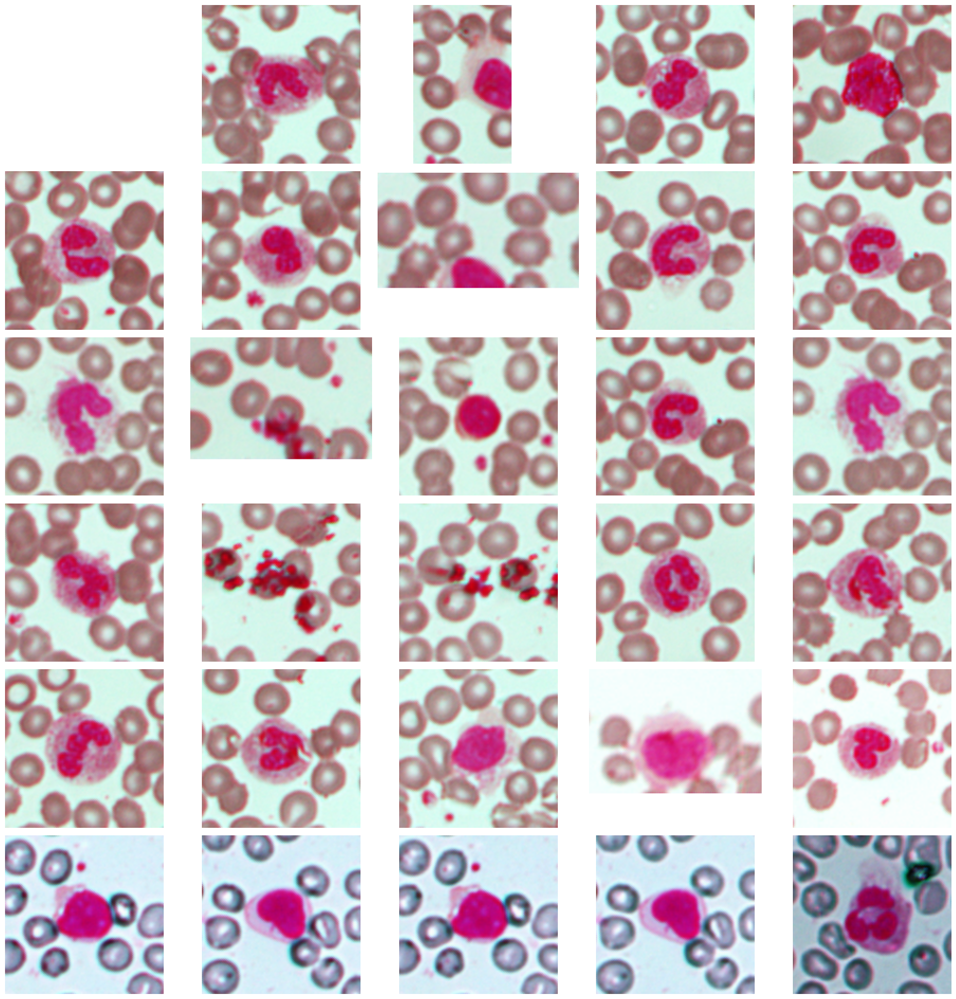

In [1]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import math
import csv

image_folder_path = 'C:\\Users\\User\\Downloads\\Dewinter2023\\Final_yolov5x\\image_sample'
#os.listdir(image_folder_path)

images = []
file_path = []
for file_name in os.listdir(image_folder_path):
    if file_name.endswith('.jpg') or file_name.endswith('.jpeg') or file_name.endswith('.png'):
        image_file_path = os.path.join(image_folder_path, file_name)
        file_path.append(image_file_path)
        images.append(cv2.imread(image_file_path))

plt.figure(figsize=(20, 20))
# Perform some operations on each image
processed_img_list = []
final_image = []
wbc_count_per_image = []
bb_coordinates = []
for i, img in enumerate(images):

    # Pad the image
    pad = 30
    padded_img = np.pad(img, ((pad, pad), (pad, pad), (0, 0)),
                        mode='constant', constant_values=255)
    # converting BGR into LAB colorspace
    lab = cv2.cvtColor(padded_img, cv2.COLOR_BGR2LAB)

    cv2.imwrite("lab_img.jpg", lab)
    lab = cv2.imread("lab_img.jpg")
    # converting BGR to RGB
    lab = cv2.cvtColor(lab, cv2.COLOR_BGR2RGB)
    # plt.imshow(lab)
    # Convert the image from RGB to HSV
    img_hsv = cv2.cvtColor(lab, cv2.COLOR_BGR2HSV)

    # Define the lower and upper bounds for the green color in the HSV color space
    lower_green = np.array([40, 130, 170])
    upper_green = np.array([90, 255, 255])

    # Threshold the HSV image based on the color range
    img_mask = cv2.inRange(img_hsv, lower_green, upper_green)

    # Display the selected image
    # plt.imshow(img_mask,cmap='gray')
    # Finding contours in the image mask
    contours, hierarchy = cv2.findContours(
        img_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    img_res = padded_img.copy()
    wbc_count = 0
    for cnt in contours:

        x, y, w, h = cv2.boundingRect(cnt)
        if w > 20 and h > 20:
            wbc_count += 1
            # Filter out small contours
            # cv2.rectangle(img_copy,(x,y),(x+w,y+h),(0,255,0),2)
            # Compute the center of the bounding box
            center_x = x + w // 2
            center_y = y + h // 2
            # Define the size of the cropped image
            crop_size = 150
            # Compute the coordinates of the top-left corner of the cropped image
            crop_x = center_x - crop_size // 2
            crop_y = center_y - crop_size // 2
            # Crop the small image from the original image
            cropped_img = padded_img[crop_y:crop_y +
                                     crop_size, crop_x:crop_x+crop_size]

            cv2.rectangle(img_res, (crop_x, crop_y),
                          (crop_x+crop_size, crop_y+crop_size), (0, 0, 255), 2)
            final_image.append(cropped_img)
            cv2.putText(img_res, 'WBC', (crop_x, crop_y-10),
                        cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 0, 255), 5)
            # final_image.append(cropped_img)
            # Draw a green rectangle
            # cv2.putText(img_copy, 'WBC', (x,y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)
            '''plt.subplot(2,len(images),i+1);plt.imshow(img_copy)'''
    wbc_count_per_image.append([file_path[i], wbc_count])
    # Add the processed image to the processed image list
    processed_img_list.append(img_res)

# save the list to a CSV file
with open("wbc_counts.csv", "w", newline="") as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(["Filename", "WBC Count"])
    writer.writerows(wbc_count_per_image)

output_folder = "cropped_images8"
os.makedirs(output_folder, exist_ok=True)

for i in range(len(final_image)):
    if final_image[i] is None or final_image[i].size == 0:
        continue
    resized_image = cv2.resize(final_image[i], (416, 416))
    output_filename = os.path.join(output_folder, f"final_image{i}.jpg")
    cv2.imwrite(output_filename, resized_image)
    plt.subplot(6, 5, i+1)
    plt.imshow(final_image[i], cmap='gray')
    plt.axis('off')
plt.tight_layout()
plt.show()

C++ CODE 

In [ ]:

'''
#include <iostream>
#include <opencv2/opencv.hpp>
#include <fstream>

using namespace cv;
using namespace std;

int main()
{
    String image_folder_path = "C:/Users/krrah/Downloads/Dewinter2023/Final_yolov5x/image_sample";
    vector<String> file_names;
    glob(image_folder_path, file_names);

    vector<Mat> final_images;
    vector<vector<string>> wbc_count_per_image;

    for (const auto &file_name : file_names)
    {
        if (!file_name.ends_with(".jpg") && !file_name.ends_with(".jpeg") && !file_name.ends_with(".png"))
            continue;

        Mat img = imread(file_name);
        if (img.empty())
            continue;

        Mat padded_img;
        copyMakeBorder(img, padded_img, 30, 30, 30, 30, BORDER_CONSTANT, Scalar(255, 255, 255));

        Mat lab;
        cvtColor(padded_img, lab, COLOR_BGR2Lab);

        Mat img_hsv;
        cvtColor(lab, img_hsv, COLOR_Lab2BGR);
        cvtColor(img_hsv, img_hsv, COLOR_BGR2HSV);

        Scalar lower_green(40, 130, 170);
        Scalar upper_green(90, 255, 255);

        Mat img_mask;
        inRange(img_hsv, lower_green, upper_green, img_mask);

        vector<vector<Point>> contours;
        findContours(img_mask, contours, RETR_TREE, CHAIN_APPROX_SIMPLE);

        Mat img_res = padded_img.clone();
        int wbc_count = 0;

        for (const auto &cnt : contours)
        {
            Rect boundingRect = cv::boundingRect(cnt);
            int w = boundingRect.width;
            int h = boundingRect.height;

            if (w > 20 && h > 20)
            {
                wbc_count++;

                int crop_size = 150;
                int center_x = boundingRect.x + w / 2;
                int center_y = boundingRect.y + h / 2;
                int crop_x = center_x - crop_size / 2;
                int crop_y = center_y - crop_size / 2;

                Mat cropped_img = padded_img(Rect(crop_x, crop_y, crop_size, crop_size));

                rectangle(img_res, Point(crop_x, crop_y), Point(crop_x + crop_size, crop_y + crop_size), Scalar(0, 0, 255), 2);
                putText(img_res, "WBC", Point(crop_x, crop_y - 10), FONT_HERSHEY_SIMPLEX, 1.5, Scalar(0, 0, 255), 5);
                final_images.push_back(cropped_img);
            }
        }

        wbc_count_per_image.push_back({file_name, to_string(wbc_count)});
    }

    ofstream csvfile("wbc_counts.csv");
    csvfile << "Filename,WBC Count\n";
    for (const auto &row : wbc_count_per_image)
    {
        for (const auto &col : row)
        {
            csvfile << col << ",";
        }
        csvfile << "\n";
    }
    csvfile.close();

    String output_folder = "cropped_images8";
    system(("mkdir " + output_folder).c_str());

    for (int i = 0; i < final_images.size(); ++i)
    {
        Mat final_image = final_images[i];
        if (final_image.empty() || final_image.total() == 0)
            continue;

        Mat resized_image;
        resize(final_image, resized_image, Size(416, 416));

        String output_filename = output_folder + "/final_image" + to_string(i) + ".jpg";
        imwrite(output_filename, resized_image);
    }

    return 0;
}
'''

In [7]:
from collections.abc import Mapping

Run detect.py on the cropped images

In [2]:
%cd C:\Users\User\Downloads\Dewinter2023\Final_yolov5x\yolov5
!python detect.py --weights C:\Users\User\Downloads\Dewinter2023\Final_yolov5x\weights_100epochs\best.pt --img 416 --conf 0.4 --source C:\Users\User\Downloads\Dewinter2023\Final_yolov5x\cropped_images8

C:\Users\User\Downloads\Dewinter2023\Final_yolov5x\yolov5
Results saved to: predictions.csv


detect: weights=['C:\\Users\\User\\Downloads\\Dewinter2023\\Final_yolov5x\\weights_100epochs\\best.pt'], source=C:\Users\User\Downloads\Dewinter2023\Final_yolov5x\cropped_images8, data=data\coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5  v6.1-306-gfbe67e4 Python-3.11.0 torch-2.0.1+cpu CPU

Fusing layers... 
custom_YOLOv5x summary: 444 layers, 86200330 parameters, 0 gradients
image 1/29 C:\Users\User\Downloads\Dewinter2023\Final_yolov5x\cropped_images8\final_image1.jpg: 416x416 Done. (4.296s)
image 2/29 C:\Users\User\Downloads\Dewinter2023\Final_yolov5x\cropped_images8\final_image10.jpg: 416x416 1 neutrophil, Done. (0.957s)
image 3/29 C:\Users\User\Downloads\Dewi

Postprocessing steps for cytoplasm detection for red and blue images separately

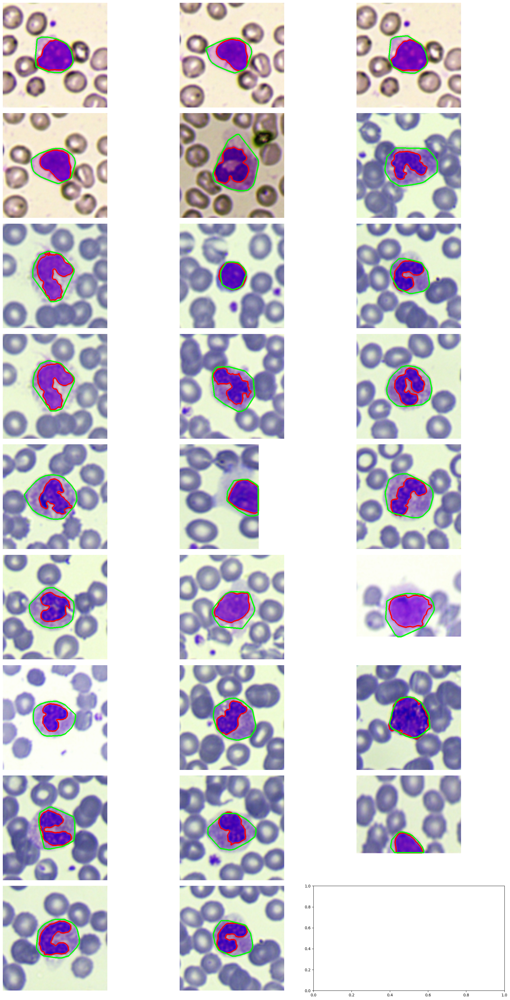

In [5]:

input_path = "C:\\Users\\User\\Downloads\\Dewinter2023\\Final_yolov5x\\red_images_sample"

processed_image_red = []
Cyto_area = []
Cyto_Perimeter = []
# Iterate over the images in the folder
for filename in os.listdir(input_path):
    if filename.endswith(".jpg"):
        image_path = os.path.join(input_path, filename)

        # Read the image
        image = cv2.imread(image_path)
        image_copy = image.copy()
        # Define the RGB to CMYK conversion function

        def select_center_contour(contours):
            if len(contours) == 0:
                return None

            # Compute the areas of all contours
            contour_areas = [cv2.contourArea(contour) for contour in contours]

            # Find the index of the contour with the largest area
            max_area_index = np.argmax(contour_areas)

            # Return the contour with the largest area
            center_contour = contours[max_area_index]

            return center_contour

        def bgr_to_cmyk(bgr):
            b, g, r = bgr/255.0
            b, g, r = b/255.0, g/255.0, r/255.0
            k = 1 - np.max([b, g, r])
            if k == 1:
                c = m = y = 0
            else:
                c = (1 - r - k) / (1 - k)
                m = (1 - g - k) / (1 - k)
                y = (1 - b - k) / (1 - k)
            return np.array([c, m, y, k])

        # Apply the RGB to CMYK conversion to each pixel using a lambda function
        cmyk_img = np.apply_along_axis(
            lambda x: bgr_to_cmyk(x), axis=2, arr=image)
        cmyk_img_copy = cmyk_img.copy()
        # plt.imshow(cmyk_img)
        # Scale the values in the CMYK image to the range 0-255
        cmyk_img = (cmyk_img*255).astype(np.uint8)

        pixels = cmyk_img.reshape(-1, 4)
        pixels = np.float32(pixels)
        # Define the criteria for K-means clustering (maximum iterations and epsilon)
        criteria = (cv2.TERM_CRITERIA_EPS +
                    cv2.TERM_CRITERIA_MAX_ITER, 100, 0.9)

        # Perform K-means clustering
        k = 5  # Number of clusters
        _, labels, centers = cv2.kmeans(
            pixels, k, None, criteria, 100, cv2.KMEANS_RANDOM_CENTERS)

        # Convert the centers to unsigned integers
        centers = np.uint8(centers)
        # Map the labels to the centers
        segmented_image = centers[labels.flatten()]

        # Reshape the segmented image back to the original shape
        segmented_image = segmented_image.reshape(cmyk_img.shape)

        cv2.imwrite("segmented_image.jpg", segmented_image)
        # Apply the RGB to CMYK conversion to each pixel using a lambda function
        bgr_img = cv2.imread("segmented_image.jpg")

        # Convert the bgr image to HSV
        segmented_HSV = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2HSV)
        # convert to gray scale image
        segmented_image_gray = cv2.cvtColor(
            segmented_image, cv2.COLOR_BGR2GRAY)
        # Set the threshold value (adjust as needed)

        _, segmented_mask = cv2.threshold(
            segmented_image_gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
        # Invert the binary image using bitwise_not()
        inverted_image = cv2.bitwise_not(segmented_mask)
        contours, _ = cv2.findContours(
            inverted_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours = select_center_contour(contours)
        cv2.drawContours(image_copy, [contours], -1, (0, 0, 255), 3)

        def smooth_contour(contour, epsilon):
            # Convert the contour to a numpy array
            contour = np.squeeze(contour)

            # Reshape the contour to fit the required format for cv2.approxPolyDP
            contour = contour.reshape((-1, 1, 2))

            # Apply the Douglas-Peucker algorithm for contour approximation
            smoothed_contour = cv2.approxPolyDP(contour, epsilon, True)

            return smoothed_contour
        H, S, V = cv2.split(segmented_HSV)

        # Apply thresholding to the H  Channel
        kernel = np.ones((3, 3), np.uint8)
        _, thresholded_image = cv2.threshold(H, 30, 255, cv2.THRESH_BINARY)

        # Define the kernel for erosion and dilation
        kernel = np.ones((5, 5), np.uint8)
        # cv2.drawContours(image_copy, contours, -1, (0, 255, 0), 2)
        segmented_mask = cv2.erode(thresholded_image, kernel, iterations=2)
        segmented_mask = cv2.morphologyEx(
            segmented_mask, cv2.MORPH_OPEN, kernel, iterations=1)

        contours, _ = cv2.findContours(
            segmented_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours = select_center_contour(contours)
        contour_areas = [cv2.contourArea(contour) for contour in contours]
        # Find the index of the contour with the largest area
        max_area_index = np.argmax(contour_areas)
        # Choose the index of the contour you want to smoothen

        # Set the epsilon value for contour smoothing (adjust as needed)
        epsilon = 0.009 * cv2.arcLength(contours[max_area_index], True)
        contours = smooth_contour(contours, epsilon)
        contours = cv2.convexHull(contours)
        cv2.drawContours(image_copy, [contours], -1, (0, 255, 0), 3)

        area = contour_areas[max_area_index]
        # peri = contour_perimeter[max_peri_index]
        Cyto_area.append(area)
        # Cyto_Perimeter.append(peri)
        processed_image_red.append(image_copy)

'''# Create a grid for displaying the images
grid_rows = int(np.ceil(len(processed_image_red) / 3))
fig, axes = plt.subplots(grid_rows, 3, figsize=(12, 4 * grid_rows))

# Iterate over the processed images and display them in the grid
for i, image_x in enumerate(processed_image_red):
    row = i // 3
    col = i % 3
    axes[row, col].imshow(cv2.cvtColor(image_x, cv2.COLOR_BGR2RGB))
    axes[row, col].axis('off')

# Adjust the layout and display the grid
plt.tight_layout()
plt.show()
'''
#-----------------------------------------------------------    For blue images  ---------------------------------------------

input_path = "C:\\Users\\User\\Downloads\\Dewinter2023\\Final_yolov5x\\blue_images_sample"

processed_image_blue = []
Cyto_area = []
Cyto_Perimeter = []
# Iterate over the images in the folder
for filename in os.listdir(input_path):
    if filename.endswith(".jpg"):
        image_path = os.path.join(input_path, filename)

       # Read the image
        image = cv2.imread(image_path)
        image_copy = image.copy()

        # plt.imshow(blurM)

        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        img_hsv = cv2.cvtColor(lab, cv2.COLOR_BGR2HSV)

        # Define the lower and upper bounds for the green color in the HSV color space
        lower_green = np.array([40, 130, 170])
        upper_green = np.array([90, 255, 255])

        # Threshold the HSV image based on the color range
        img_mask = cv2.inRange(img_hsv, lower_green, upper_green)

        # Find contours in the thresholded image
        contours, _ = cv2.findContours(
            img_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        def select_center_contour(contours):
            if len(contours) == 0:
                return None

            # Compute the areas of all contours
            contour_areas = [cv2.contourArea(contour) for contour in contours]

            # Find the index of the contour with the largest area
            max_area_index = np.argmax(contour_areas)

            # Return the contour with the largest area
            center_contour = contours[max_area_index]

            return center_contour
        nucleus_contour = select_center_contour(contours)
        cv2.drawContours(image_copy, [nucleus_contour], -1, (0, 0, 255), 3)

        pixels = image.reshape(-1, 3)
        pixels = np.float32(pixels)
        # Define the criteria for K-means clustering (maximum iterations and epsilon)
        criteria = (cv2.TERM_CRITERIA_EPS +
                    cv2.TERM_CRITERIA_MAX_ITER, 100, 0.5)

        # Perform K-means clustering
        k = 7  # Number of clusters
        _, labels, centers = cv2.kmeans(
            pixels, k, None, criteria, 100, cv2.KMEANS_RANDOM_CENTERS)

        # Convert the centers to unsigned integers
        centers = np.uint8(centers)
        # Map the labels to the centers
        segmented_image = centers[labels.flatten()]

        # Reshape the segmented image back to the original shape
        segmented_image = segmented_image.reshape(image.shape)

        # Convert the segmented image to grayscale
        segmented_image_gray = cv2.cvtColor(
            segmented_image, cv2.COLOR_RGB2GRAY)

        # Threshold the grayscale image
        _, segmented_mask = cv2.threshold(
            segmented_image_gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)

        # Apply the segmented mask to the original image
        segmented_result = cv2.bitwise_and(
            image_copy, image_copy, mask=segmented_mask)

        def smooth_contour(contour, epsilon):
            # Convert the contour to a numpy array
            contour = np.squeeze(contour)

            # Reshape the contour to fit the required format for cv2.approxPolyDP
            contour = contour.reshape((-1, 1, 2))

            # Apply the Douglas-Peucker algorithm for contour approximation
            smoothed_contour = cv2.approxPolyDP(contour, epsilon, True)

            return smoothed_contour
        mask = np.zeros(segmented_mask.shape[:2], dtype="uint8")
        segmented_copy = segmented_result.copy()
        # contours, _ = cv2.findContours(contour_portion,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        segmented_HSV = cv2.cvtColor(segmented_result, cv2.COLOR_BGR2HSV)
        H, S, V = cv2.split(segmented_HSV)
        kernel = np.ones((10, 10), np.uint8)
        _, thresholded_image = cv2.threshold(H, 128, 255, cv2.THRESH_BINARY)
        # Perform morphological closing to fill holes
        filled_image = cv2.morphologyEx(
            thresholded_image, cv2.MORPH_CLOSE, kernel)
        kernel = np.ones((10, 10), np.uint8)
        # Perform morphological opening to remove small dust particles
        opened_image = cv2.morphologyEx(filled_image, cv2.MORPH_OPEN, kernel)
        contours_cyto, _ = cv2.findContours(
            opened_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        # Select the center contour

        contour_areas = [cv2.contourArea(contour) for contour in contours_cyto]
        contour_perimeter = [cv2.arcLength(
            contour, True) for contour in contours_cyto]
        # Find the index of the contour with the largest area
        max_area_index = np.argmax(contour_areas)
        max_peri_index = np.argmax(contour_perimeter)
        area = contour_areas[max_area_index]
        peri = contour_perimeter[max_peri_index]
        convex_cyto = cv2.convexHull(contours_cyto[max_area_index])
        Cyto_area.append(area)
        Cyto_Perimeter.append(peri)
        processed_image_blue.append(image_copy)
        cv2.drawContours(image_copy, [convex_cyto], -1, (0, 255, 0), 3)
processed_image = processed_image_red + processed_image_blue
# Create a grid for displaying the images
grid_rows = int(np.ceil(len(processed_image) / 3))
fig, axes = plt.subplots(grid_rows, 3, figsize=(20, 4 * grid_rows))

# Iterate over the processed images and display them in the grid
for i, image_x in enumerate(processed_image):
    row = i // 3
    col = i % 3
    axes[row, col].imshow(cv2.cvtColor(image_x, cv2.COLOR_BGR2RGB))
    axes[row, col].axis('off')

# Adjust the layout and display the grid
plt.tight_layout()
plt.show()

C++ CODE

In [ ]:
"""
#include <iostream>
#include <vector>
#include <string>
#include <opencv2/opencv.hpp>
#include <filesystem>

namespace fs = std::filesystem;

cv::Mat select_center_contour(const std::vector<std::vector<cv::Point>>& contours) {
    if (contours.empty()) {
        return cv::Mat();
    }

    std::vector<double> contour_areas(contours.size());
    for (size_t i = 0; i < contours.size(); ++i) {
        contour_areas[i] = cv::contourArea(contours[i]);
    }

    auto max_area_index = std::max_element(contour_areas.begin(), contour_areas.end()) - contour_areas.begin();

    return cv::Mat(contours[max_area_index]);
}

cv::Mat bgr_to_cmyk(const cv::Mat& bgr) {
    cv::Mat cmyk;
    cv::Mat bgr_float;
    bgr.convertTo(bgr_float, CV_32F, 1.0 / 255.0);

    std::vector<cv::Mat> bgr_channels;
    cv::split(bgr_float, bgr_channels);

    cv::Mat k = 1 - cv::max(cv::max(bgr_channels[0], bgr_channels[1]), bgr_channels[2]);
    cv::Mat c, m, y;
    cv::divide(1 - bgr_channels[2] - k, 1 - k, c);
    cv::divide(1 - bgr_channels[1] - k, 1 - k, m);
    cv::divide(1 - bgr_channels[0] - k, 1 - k, y);

    cv::merge(std::vector<cv::Mat>{c, m, y, k}, cmyk);
    return cmyk;
}

int main() {
    std::string input_path = "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\Red_images_sample";

    std::vector<cv::Mat> processed_images;
    std::vector<double> cyto_areas;
    std::vector<double> cyto_perimeters;

    for (const auto& filename : fs::directory_iterator(input_path)) {
        if (filename.path().extension() == ".jpg") {
            cv::Mat image = cv::imread(filename.path().string());

            cv::Mat image_copy = image.clone();
            cv::Mat cmyk_img = bgr_to_cmyk(image);

            cv::Mat pixels = cmyk_img.reshape(1, cmyk_img.total());
            pixels.convertTo(pixels, CV_32F);
            cv::Mat labels, centers;
            cv::kmeans(pixels, 5, labels, cv::TermCriteria(cv::TermCriteria::EPS + cv::TermCriteria::MAX_ITER, 100, 0.9), 100, cv::KMEANS_RANDOM_CENTERS, centers);

            cv::Mat segmented_image = centers.row(labels.reshape(1, image.rows));
            segmented_image = segmented_image.reshape(4, image.rows);
            segmented_image.convertTo(segmented_image, CV_8UC4);
            cv::imwrite("segmented_image.jpg", segmented_image);

            cv::Mat bgr_image = cv::imread("segmented_image.jpg");
            cv::Mat segmented_hsv;
            cv::cvtColor(bgr_image, segmented_hsv, cv::COLOR_BGR2HSV);
            cv::Mat segmented_gray;
            cv::cvtColor(segmented_image, segmented_gray, cv::COLOR_BGR2GRAY);

            cv::Mat segmented_mask;
            cv::threshold(segmented_gray, segmented_mask, 0, 255, cv::THRESH_BINARY_INV | cv::THRESH_OTSU);
            cv::Mat inverted_mask = ~segmented_mask;

            std::vector<std::vector<cv::Point>> contours;
            cv::findContours(inverted_mask, contours, cv::RETR_EXTERNAL, cv::CHAIN_APPROX_SIMPLE);
            cv::Mat center_contour = select_center_contour(contours);
            cv::drawContours(image_copy, std::vector<cv::Mat>{center_contour}, -1, cv::Scalar(0, 0, 255), 3);

            double area = cv::contourArea(center_contour);
            cyto_areas.push_back(area);
            processed_images.push_back(image_copy);
        }
    }

    int grid_rows = std::ceil(processed_images.size() / 3.0);
    cv::Size grid_size(3, grid_rows);
    cv::Mat grid_image(grid_rows * processed_images[0].rows, 3 * processed_images[0].cols, CV_8UC3, cv::Scalar(255, 255, 255));

    for (size_t i = 0; i < processed_images.size(); ++i) {
        int row = i / 3;
        int col = i % 3;
        cv::Rect roi(col * processed_images[0].cols, row * processed_images[0].rows, processed_images[i].cols, processed_images[i].rows);
        processed_images[i].copyTo(grid_image(roi));
    }

    cv::imshow("Processed Images", grid_image);
    cv::waitKey(0);

    return 0;
}

"""

#for blue images

'''
#include <iostream>
#include <vector>
#include <string>
#include <opencv2/opencv.hpp>
#include <filesystem>

namespace fs = std::filesystem;

cv::Mat select_center_contour(const std::vector<std::vector<cv::Point>>& contours) {
    if (contours.empty()) {
        return cv::Mat();
    }

    std::vector<double> contour_areas(contours.size());
    for (size_t i = 0; i < contours.size(); ++i) {
        contour_areas[i] = cv::contourArea(contours[i]);
    }

    auto max_area_index = std::max_element(contour_areas.begin(), contour_areas.end()) - contour_areas.begin();

    return cv::Mat(contours[max_area_index]);
}

cv::Mat bgr_to_lab(const cv::Mat& bgr) {
    cv::Mat lab;
    cv::cvtColor(bgr, lab, cv::COLOR_BGR2Lab);
    return lab;
}

cv::Mat bgr_to_hsv(const cv::Mat& bgr) {
    cv::Mat hsv;
    cv::cvtColor(bgr, hsv, cv::COLOR_BGR2HSV);
    return hsv;
}

cv::Mat threshold_hsv(const cv::Mat& hsv, const cv::Scalar& lower_bound, const cv::Scalar& upper_bound) {
    cv::Mat mask;
    cv::inRange(hsv, lower_bound, upper_bound, mask);
    return mask;
}

cv::Mat smooth_contour(const cv::Mat& contour, double epsilon) {
    cv::Mat smoothed_contour;
    cv::approxPolyDP(contour, smoothed_contour, epsilon, true);
    return smoothed_contour;
}

int main() {
    std::string input_path = "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\blue_images_sample";

    std::vector<cv::Mat> processed_images;
    std::vector<double> cyto_areas;
    std::vector<double> cyto_perimeters;

    for (const auto& filename : fs::directory_iterator(input_path)) {
        if (filename.path().extension() == ".jpg") {
            cv::Mat image = cv::imread(filename.path().string());
            cv::Mat image_copy = image.clone();

            cv::Mat lab = bgr_to_lab(image);
            cv::Mat hsv = bgr_to_hsv(lab);

            cv::Scalar lower_green(40, 130, 170);
            cv::Scalar upper_green(90, 255, 255);

            cv::Mat img_mask = threshold_hsv(hsv, lower_green, upper_green);

            std::vector<std::vector<cv::Point>> contours;
            cv::findContours(img_mask, contours, cv::RETR_EXTERNAL, cv::CHAIN_APPROX_SIMPLE);

            cv::Mat nucleus_contour = select_center_contour(contours);
            cv::drawContours(image_copy, std::vector<cv::Mat>{nucleus_contour}, -1, cv::Scalar(0, 0, 255), 3);

            cv::Mat pixels = image.reshape(1, image.total());
            pixels.convertTo(pixels, CV_32F);
            cv::Mat labels, centers;
            cv::kmeans(pixels, 7, labels, cv::TermCriteria(cv::TermCriteria::EPS + cv::TermCriteria::MAX_ITER, 100, 0.5), 100, cv::KMEANS_RANDOM_CENTERS, centers);

            cv::Mat segmented_image = centers.row(labels.reshape(1, image.rows));
            segmented_image = segmented_image.reshape(3, image.rows);

            cv::Mat segmented_image_gray;
            cv::cvtColor(segmented_image, segmented_image_gray, cv::COLOR_BGR2GRAY);

            cv::Mat segmented_mask;
            cv::threshold(segmented_image_gray, segmented_mask, 0, 255, cv::THRESH_BINARY_INV | cv::THRESH_OTSU);

            cv::Mat segmented_result;
            cv::bitwise_and(image_copy, image_copy, segmented_result, segmented_mask);

            cv::Mat filled_image, opened_image;
            cv::Mat H, S, V;
            cv::split(segmented_result, std::vector<cv::Mat>{H, S, V});
            cv::threshold(H, H, 128, 255, cv::THRESH_BINARY);
            cv::Mat kernel = cv::getStructuringElement(cv::MORPH_RECT, cv::Size(10, 10));
            cv::morphologyEx(H, filled_image, cv::MORPH_CLOSE, kernel);
            cv::morphologyEx(filled_image, opened_image, cv::MORPH_OPEN, kernel);

            std::vector<std::vector<cv::Point>> contours_cyto;
            cv::findContours(opened_image, contours_cyto, cv::RETR_EXTERNAL, cv::CHAIN_APPROX_SIMPLE);

            std::vector<double> contour_areas(contours_cyto.size());
            std::vector<double> contour_perimeters(contours_cyto.size());
            for (size_t i = 0; i < contours_cyto.size(); ++i) {
                contour_areas[i] = cv::contourArea(contours_cyto[i]);
                contour_perimeters[i] = cv::arcLength(contours_cyto[i], true);
            }

            auto max_area_index = std::max_element(contour_areas.begin(), contour_areas.end()) - contour_areas.begin();
            auto max_perimeter_index = std::max_element(contour_perimeters.begin(), contour_perimeters.end()) - contour_perimeters.begin();
            double area = contour_areas[max_area_index];
            double perimeter = contour_perimeters[max_perimeter_index];

            cyto_areas.push_back(area);
            cyto_perimeters.push_back(perimeter);
            processed_images.push_back(image_copy);

            cv::Mat convex_cyto;
            cv::convexHull(contours_cyto[max_area_index], convex_cyto);
            cv::drawContours(image_copy, std::vector<cv::Mat>{convex_cyto}, -1, cv::Scalar(0, 255, 0), 3);
        }
    }

    int grid_rows = std::ceil(processed_images.size() / 3.0);
    cv::Size grid_size(3, grid_rows);
    cv::Mat grid_image(grid_rows * processed_images[0].rows, 3 * processed_images[0].cols, CV_8UC3, cv::Scalar(255, 255, 255));

    for (size_t i = 0; i < processed_images.size(); ++i) {
        int row = i / 3;
        int col = i % 3;
        cv::Rect roi(col * processed_images[0].cols, row * processed_images[0].rows, processed_images[i].cols, processed_images[i].rows);
        processed_images[i].copyTo(grid_image(roi));
    }

    cv::imshow("Processed Images", grid_image);
    cv::waitKey(0);

    return 0;
}

'''
